In [1]:
from all_imports import *
import _modules 

from _modules.plotColors import *

import datetime as dt

 ### test init### 


## Testing

In [ ]:
import os
import pandas as pd

def extract_air_temperature(directory: str, specific_index: int, output_file: str):
    """
    Extracts the AirTemperature from CSV files in the specified directory at the given index and saves the results to a CSV file.
    
    Args:
    - directory (str): Path to the directory containing the CSV files.
    - specific_index (int): Index of the row to select from each file.
    - output_file (str): Path where the result CSV file will be saved.
    
    Returns:
    - None
    """
    # Initialize an empty DataFrame to store the results
    result_df = pd.DataFrame()

    # Iterate over all files in the directory
    for filename in os.listdir(directory):
        if filename.endswith(".csv"):
            # Construct the full file path
            file_path = os.path.join(directory, filename)
            
            # Read the CSV file into a DataFrame, using the first column as index
            df = pd.read_csv(file_path, index_col=0)  # Use the first column as index
            
            # Check if the index is within bounds
            if specific_index not in df.index:
                print(f"File {filename} does not contain the index {specific_index}, skipping...")
                continue
            
            # Select the row by index and extract only the `AirTemperature` column
            selected_row = df.loc[specific_index, ['AirTemperature']]  # Select only the `AirTemperature` column
            selected_row = selected_row.to_frame().T  # Convert Series to DataFrame
            
            # Extract datetime from the filename
            base_name = os.path.splitext(filename)[0]
            datetime_str = base_name.split('_', 1)[1]  # Extract the portion after the first underscore
            
            # Format the datetime string
            year = datetime_str[0:4]
            month = datetime_str[5:7]
            day = datetime_str[8:10]
            hour = datetime_str[11:13]
            minute = datetime_str[14:16]
            datetime_formatted = f"{year}-{month}-{day} {hour}:{minute} +8"
            
            # Add datetime to the selected row
            selected_row['datetime'] = datetime_formatted
            
            # Append to the result DataFrame
            result_df = pd.concat([result_df, selected_row], ignore_index=True)

    # Save the result to a new CSV file
    result_df.to_csv(output_file, index=False)

    print(f"Data successfully saved to {output_file}")

# Example usage
extract_air_temperature(r"D:\Simulation\InterpolationResults\2024-09-09_20-00\AirTemperature", 30318, r"D:\Simulation\InterpolationResults\selected_data1.csv")
extract_air_temperature(r"D:\Simulation\InterpolationResults\2024-09-09_20-00\AirTemperature", 36560, r"D:\Simulation\InterpolationResults\selected_data2.csv")
extract_air_temperature(r"D:\Simulation\InterpolationResults\2024-09-09_20-00\AirTemperature", 56459, r"D:\Simulation\InterpolationResults\selected_data3.csv")


In [77]:
result_df1 = pd.read_csv(r"D:\Simulation\InterpolationResults\selected_data1.csv")
result_df2 = pd.read_csv(r"D:\Simulation\InterpolationResults\selected_data2.csv")
result_df3 = pd.read_csv(r"D:\Simulation\InterpolationResults\selected_data3.csv")

In [ ]:
man_comb_df = pd.read_csv(r"C:\Users\gottk\OneDrive\Storage\Projects\2024-08-00_MTHCOM_Masterthesis-Outdoor-Comfort\Thermal_Walk\Process\Dataset.csv")
man_comb_df['time_slice'] = pd.to_datetime(man_comb_df['time_slice'],  format='%m/%d/%Y %H:%M:%S')
columns_to_numeric = [
    'ts_altitude', 'ts_heart_rate', 'ts_latitude', 'ts_longitude', 'ts_oxygen_saturation', 
    'ws_heart_rate', 'ws_latitude', 'ws_longitude', 'ws_oxygen_saturation', 
    'Wst_GlobeT_C', 'Wst_Windspeed_ms', 'Wst_Winddirection_deg', 'Wst_Temperature_C', 
    'Wst_Relativehumidity_p', 'Wst_Dewpoint_C', 'Wst_Solar radiation_Wm', 
    'Scoria_latitude', 'Scoria_longitude', 'Scoria_horizontal_accuracy', 
    'Scoria_msl_altitude', 'Scoria_ellipsoid_altitude', 'Scoria_vertical_accuracy', 
    'Scoria_speed', 'Scoria_speed_accuracy', 'run_number'
]
man_comb_df[columns_to_numeric] = man_comb_df[columns_to_numeric].apply(pd.to_numeric, errors='coerce')


man_comb_df = man_comb_df[['time_slice', 'Wst_Temperature_C']]
man_comb_df['datetime'] = pd.to_datetime(man_comb_df['time_slice']).dt.tz_localize('Asia/Singapore')
display(man_comb_df[['datetime', 'Wst_Temperature_C']].head(3))


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Example: Load your dataframes (update the paths as necessary)
# result_df = pd.read_csv(r"D:\Simulation\InterpolationResults\selected_data.csv")
# man_comb_df = pd.read_csv(r"path_to_man_comb_df.csv")

# Ensure 'datetime' columns are in datetime format
result_df1['datetime'] = pd.to_datetime(result_df1['datetime'])
result_df2['datetime'] = pd.to_datetime(result_df2['datetime'])
result_df3['datetime'] = pd.to_datetime(result_df3['datetime'])
man_comb_df['datetime'] = pd.to_datetime(man_comb_df['datetime'])

# Round the datetimes to the nearest minute
result_df1['rounded_datetime'] = result_df1['datetime'].dt.floor('T')
result_df2['rounded_datetime'] = result_df2['datetime'].dt.floor('T')
result_df3['rounded_datetime'] = result_df3['datetime'].dt.floor('T')
man_comb_df['rounded_datetime'] = man_comb_df['datetime'].dt.floor('T')

# Plot the data
plt.figure(figsize=(14, 7))

# Plot AirTemperature
plt.subplot(2, 1, 1)
plt.plot(result_df1['rounded_datetime'], result_df1['AirTemperature'], marker='o', linestyle='-', color='b')
plt.xlabel('Datetime')
plt.ylabel('AirTemperature')
plt.title('AirTemperature Over Time')
plt.grid(True)

plt.subplot(2, 1, 1)
plt.plot(result_df2['rounded_datetime'], result_df2['AirTemperature'], marker='o', linestyle='-', color='b')
plt.xlabel('Datetime')
plt.ylabel('AirTemperature')
plt.title('AirTemperature Over Time')
plt.grid(True)

plt.subplot(2, 1, 1)
plt.plot(result_df3['rounded_datetime'], result_df3['AirTemperature'], marker='o', linestyle='-', color='b')
plt.xlabel('Datetime')
plt.ylabel('AirTemperature')
plt.title('AirTemperature Over Time')
plt.grid(True)

# Plot Wst_Temperature_C
plt.subplot(2, 1, 2)
plt.plot(man_comb_df['rounded_datetime'], man_comb_df['Wst_Temperature_C'], marker='o', linestyle='-', color='r')
plt.xlabel('Datetime')
plt.ylabel('Wst_Temperature_C')
plt.title('Wst_Temperature_C Over Time')
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Load your data
result_df1 = pd.read_csv(r"D:\Simulation\InterpolationResults\2024-09-09_20-00\AirTemperature\AirTemperature_2024-01-19_10_33_00_08_00.csv")
result_df2 = pd.read_csv(r"D:\Simulation\InterpolationResults\2024-09-09_20-00\AirTemperature\AirTemperature_2024-02-11_17_16_00_08_00.csv")
result_df3 = pd.read_csv(r"D:\Simulation\InterpolationResults\2024-09-09_20-00\AirTemperature\AirTemperature_2024-04-05_17_07_00_08_00.csv")

# Create a heatmap function
def create_heatmap(df, date_str):
    # Ensure the DataFrame has the correct columns for pivot
    if 'X' not in df.columns or 'Y' not in df.columns or 'AirTemperature' not in df.columns:
        raise ValueError("DataFrame must contain 'X', 'Y', and 'AirTemperature' columns.")
    
    # Pivot the DataFrame for heatmap
    pivot_df = df.pivot(index='Y', columns='X', values='AirTemperature')
    
    fig = px.imshow(
        pivot_df,
        color_continuous_scale='Viridis',  # Choose a color scale
        range_color=[25, 35],  # Set the color scale range
        title=f'Heatmap for {date_str}'
    )
    
    fig.update_layout(
        xaxis_title='X',
        yaxis_title='Y',
        height=800,
        width=800,
        coloraxis_colorbar=dict(
            title='Air Temperature',
            tickvals=[25, 30, 35],
            ticktext=['25°C', '30°C', '35°C']
        )
    )
    fig.show()

# Plot heatmaps for each DataFrame
create_heatmap(result_df1, '2024-01-19')
create_heatmap(result_df2, '2024-02-11')
create_heatmap(result_df3, '2024-04-05')


## With Manual checked Thermal WalkData

In [2]:
import pandas as pd

# man_comb_df = pd.read_csv(
#     r"C:\Users\gottk\OneDrive\GITHUB\calma-esse-heat-stress-internal\Esse\data\processed\cozieMeasureDf_validation.csv",
#     parse_dates=['time_slice'],
#     dayfirst=False
# )

man_comb_df = pd.read_csv(
    r"C:\Users\gottk\OneDrive\GITHUB\calma-esse-heat-stress-internal\Esse\src\cozieMeasureDf.csv",
    parse_dates=['time_slice'],
    dayfirst=False
)


man_comb_df['index_time'] = man_comb_df['time_slice'].dt.tz_localize('Asia/Singapore')

# Move 'index_time' to the front and drop 'time_slice'
man_comb_df = man_comb_df.drop(columns=['time_slice'])
man_comb_df = man_comb_df[['index_time'] + [col for col in man_comb_df.columns if col != 'index_time']]

# Convert only numeric columns
numeric_cols = man_comb_df.select_dtypes(include='number').columns
man_comb_df[numeric_cols] = man_comb_df[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Count non-NaN values for each column
non_nan_counts = man_comb_df.notna().sum()

# Convert the Series to a DataFrame
non_nan_counts_df = non_nan_counts.reset_index()
non_nan_counts_df.columns = ['Column', 'Non-NaN Count']

# Display the resulting DataFrame
display(non_nan_counts_df)

C:\Users\gottk\AppData\Local\Temp\ipykernel_33212\2444730596.py:9: DtypeWarning: Columns (7,9,11,15,23) have mixed types. Specify dtype option on import or set low_memory=False.
  man_comb_df = pd.read_csv(


,Column,Non-NaN Count
0,index_time,38216
1,Unnamed: 0,38216
2,id_participant,38216
3,q_clothing_color,232
4,q_clothing_insulation,232
...,...,...
58,Radiation_time_difference,11595
59,Humidity,11595
60,Humidity_time_difference,11595
61,WindSpeed,11595


In [3]:
Wst_df = man_comb_df.copy()
Wst_df = Wst_df[Wst_df['Wst_Temperature_C'].notna()]
#display(Wst_df)

Int_df = man_comb_df.copy()
Int_df = Int_df.sort_values('index_time')
#display(Int_df)

def add_nearest_wst_data(Int_df, Wst_df):
    # Initialize new columns
    new_columns = [
        'mWST_Windspeed_ms',
        'mWST_Winddirection_deg',
        'mWST_Temperature_C',
        'mWST_Relativehumidity_p',
        'mWST_Dewpoint_C',
        'mWST_Solar_radiation_Wm',
        'time_difference'
    ]
    
    for col in new_columns:
        Int_df[col] = np.nan
    
    for i, row in Int_df.iterrows():
        if not pd.isna(row['c_longitude']):
            target_time = row['index_time']
            
            # Find the closest time in Wst_df
            closest_index = Wst_df['index_time'].sub(target_time).abs().idxmin()
            closest_time = Wst_df.loc[closest_index, 'index_time']
            
            # Get the corresponding values and time_difference
            wst_data = Wst_df.loc[closest_index, [
                'Wst_Windspeed_ms',
                'Wst_Winddirection_deg',
                'Wst_Temperature_C',
                'Wst_Relativehumidity_p',
                'Wst_Dewpoint_C',
                'Wst_Solar radiation_Wm'
            ]]
            time_diff = abs((closest_time - target_time).total_seconds())
            
            # Assign the values to the new columns
            Int_df.at[i, 'mWST_Windspeed_ms'] = wst_data['Wst_Windspeed_ms']
            Int_df.at[i, 'mWST_Winddirection_deg'] = wst_data['Wst_Winddirection_deg']
            Int_df.at[i, 'mWST_Temperature_C'] = wst_data['Wst_Temperature_C']
            Int_df.at[i, 'mWST_Relativehumidity_p'] = wst_data['Wst_Relativehumidity_p']
            Int_df.at[i, 'mWST_Dewpoint_C'] = wst_data['Wst_Dewpoint_C']
            Int_df.at[i, 'mWST_Solar_radiation_Wm'] = wst_data['Wst_Solar radiation_Wm']
            Int_df.at[i, 'time_difference'] = time_diff
    
    return Int_df

# Usage
Int_df = add_nearest_wst_data(Int_df, Wst_df)

Int_df.to_csv('test.csv')

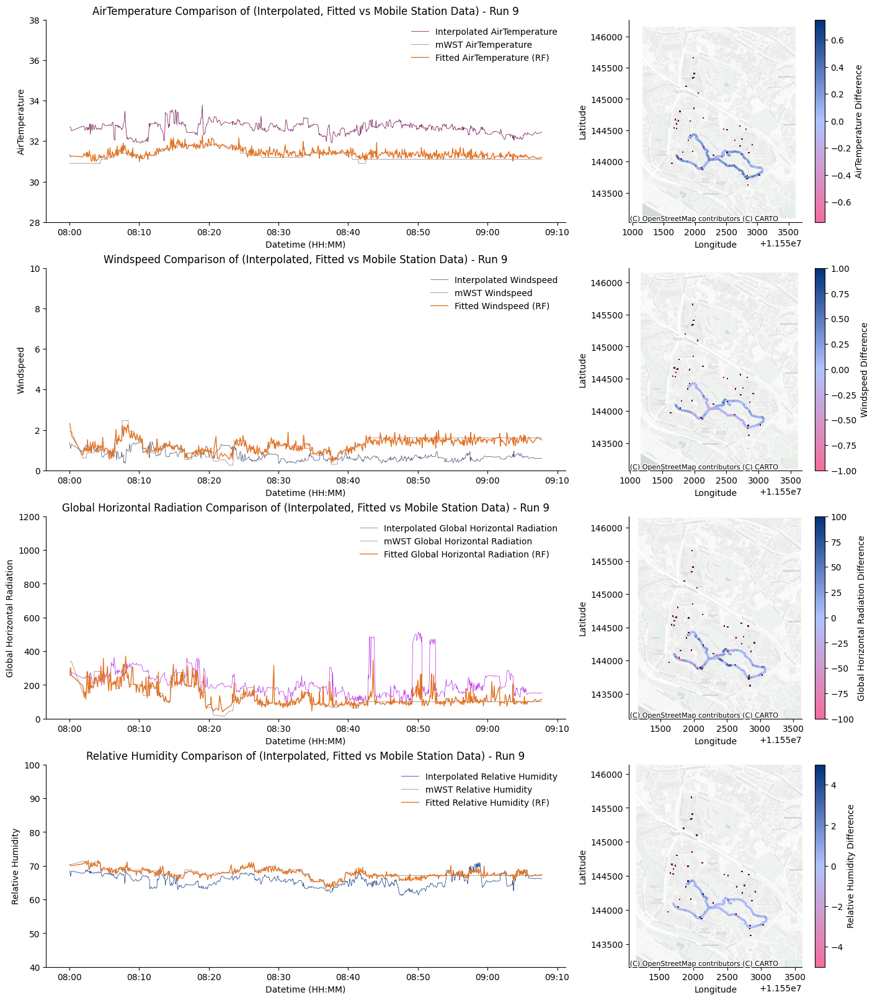

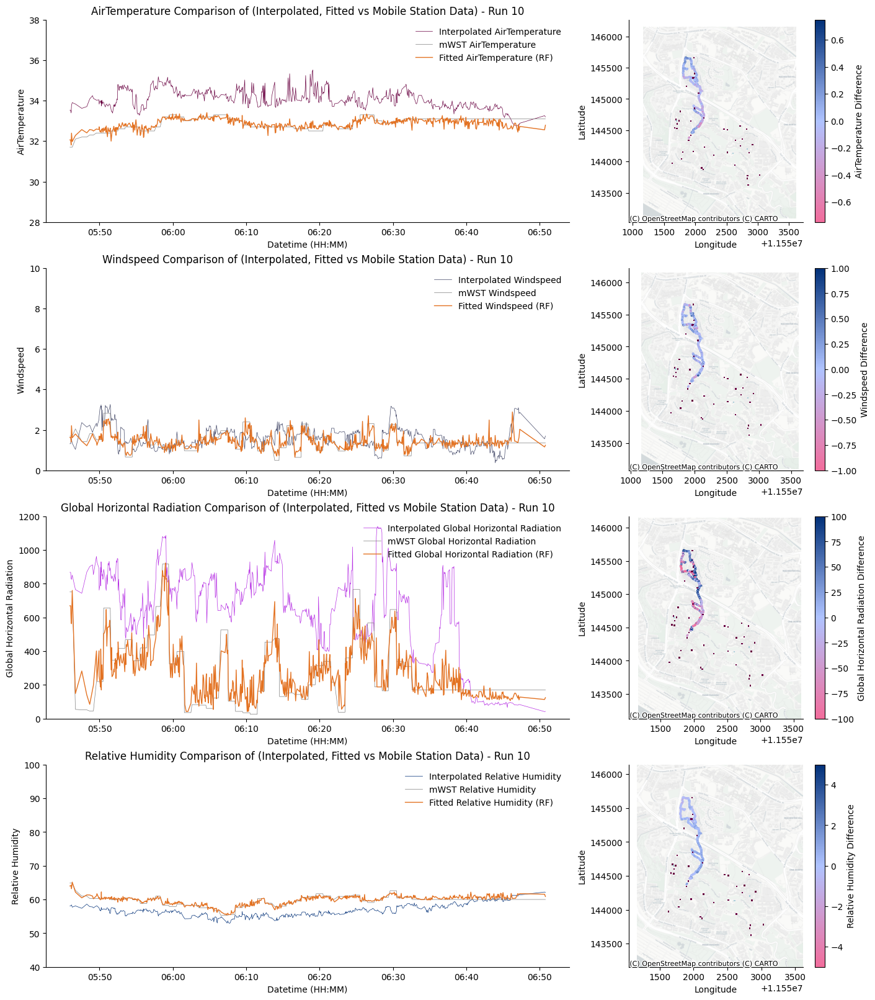

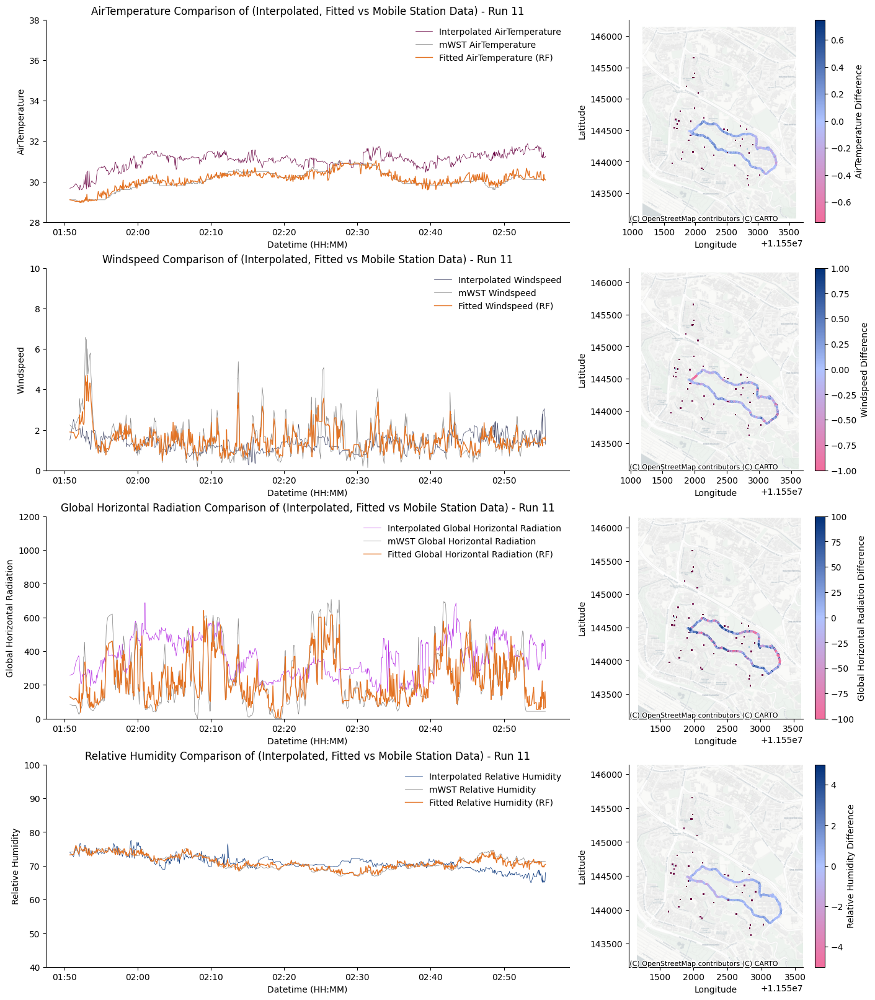

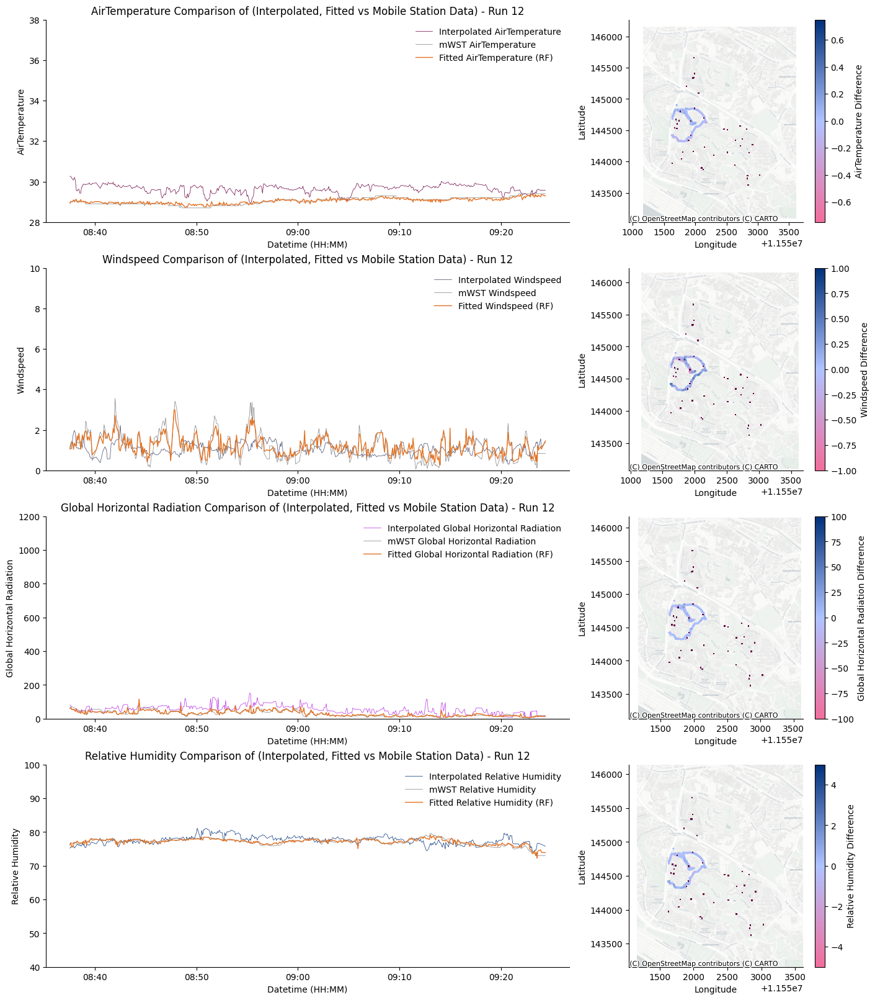

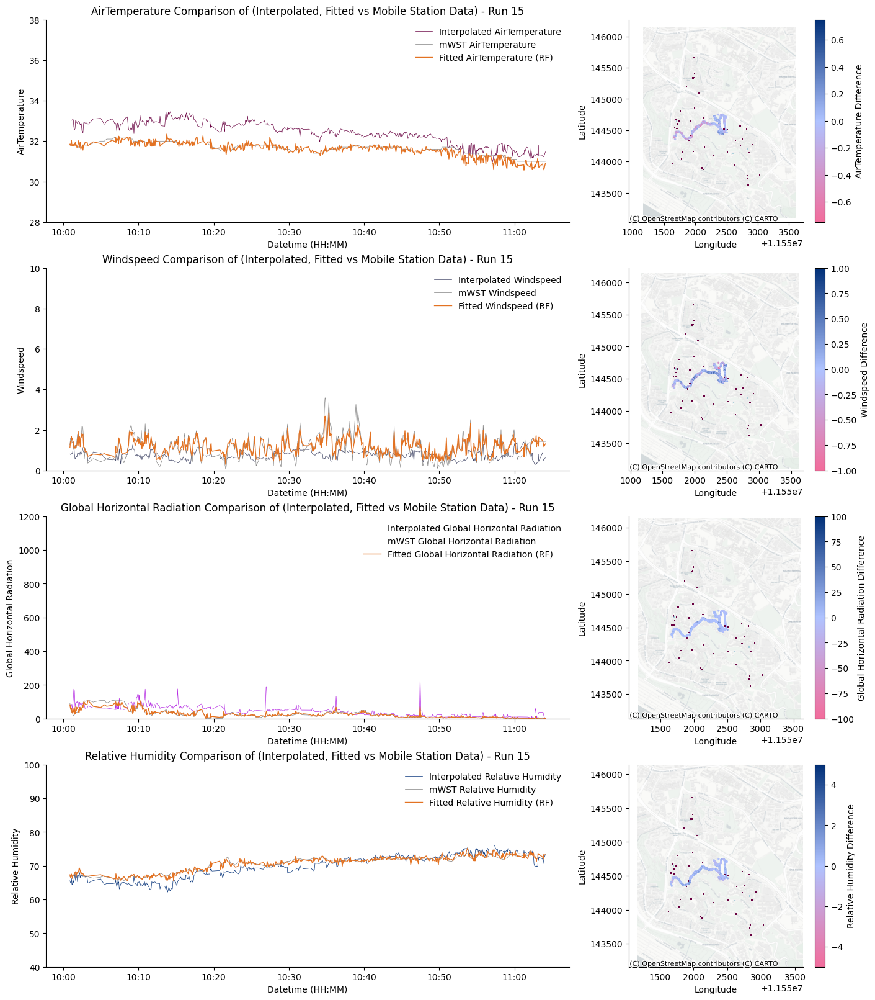

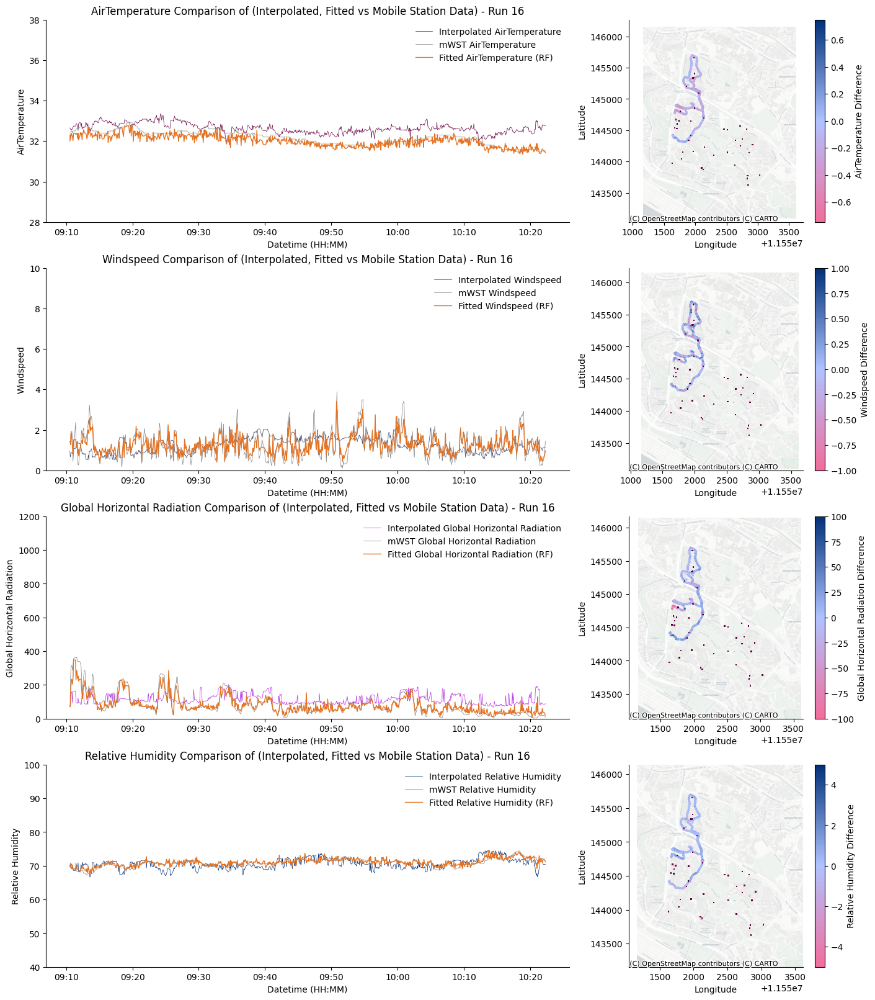

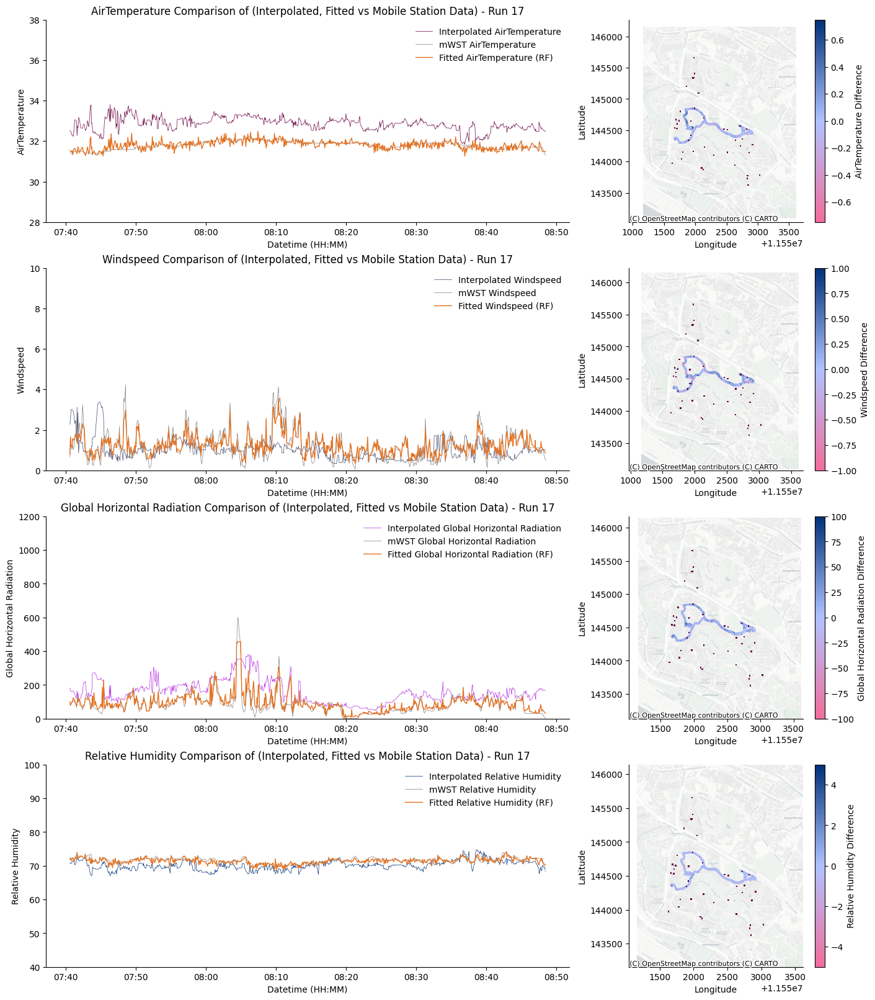

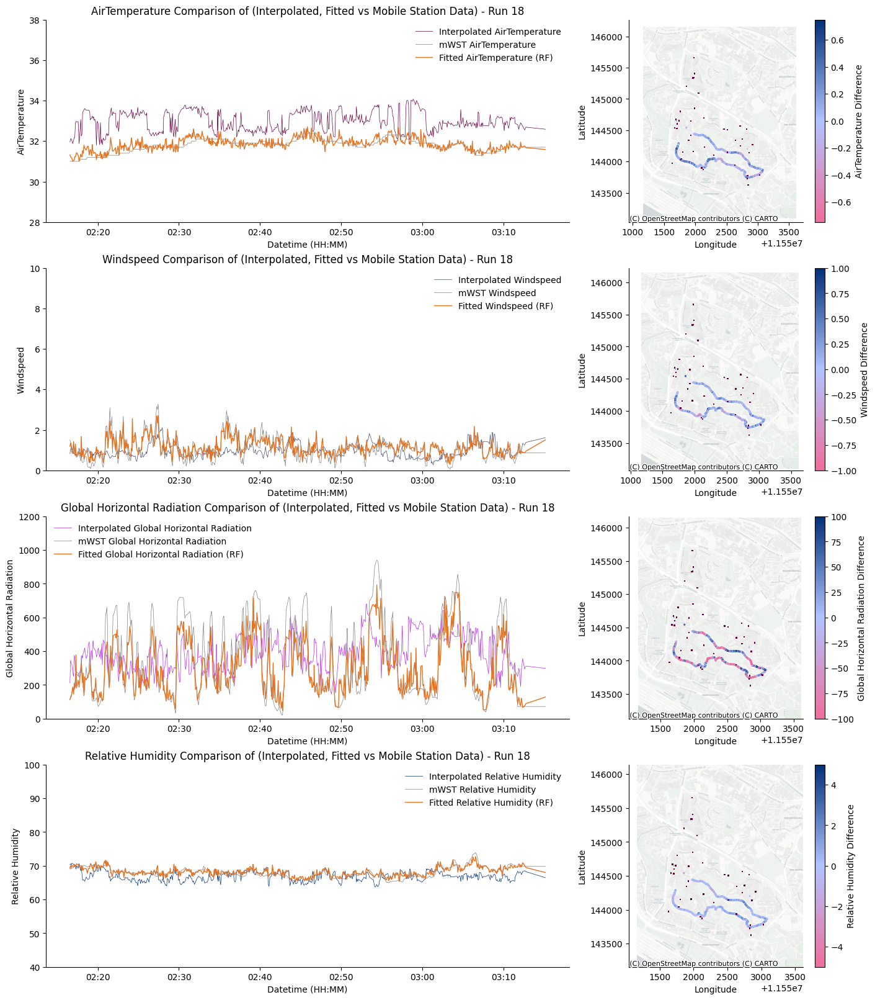

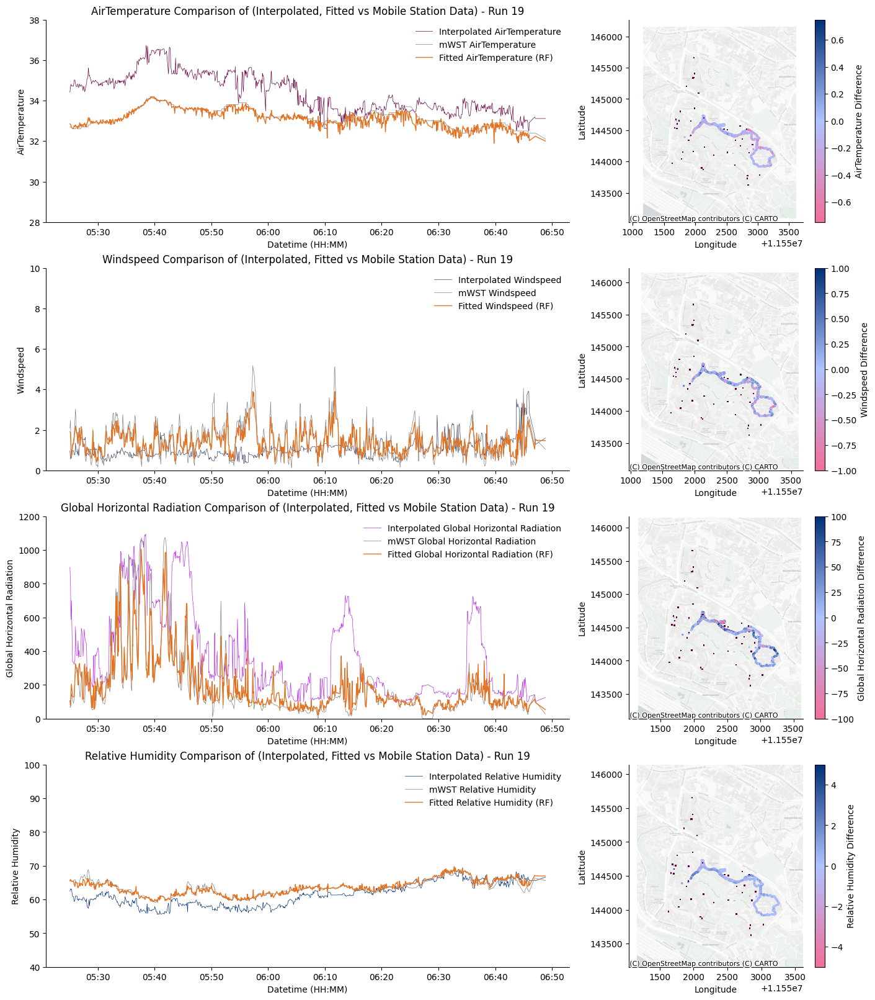

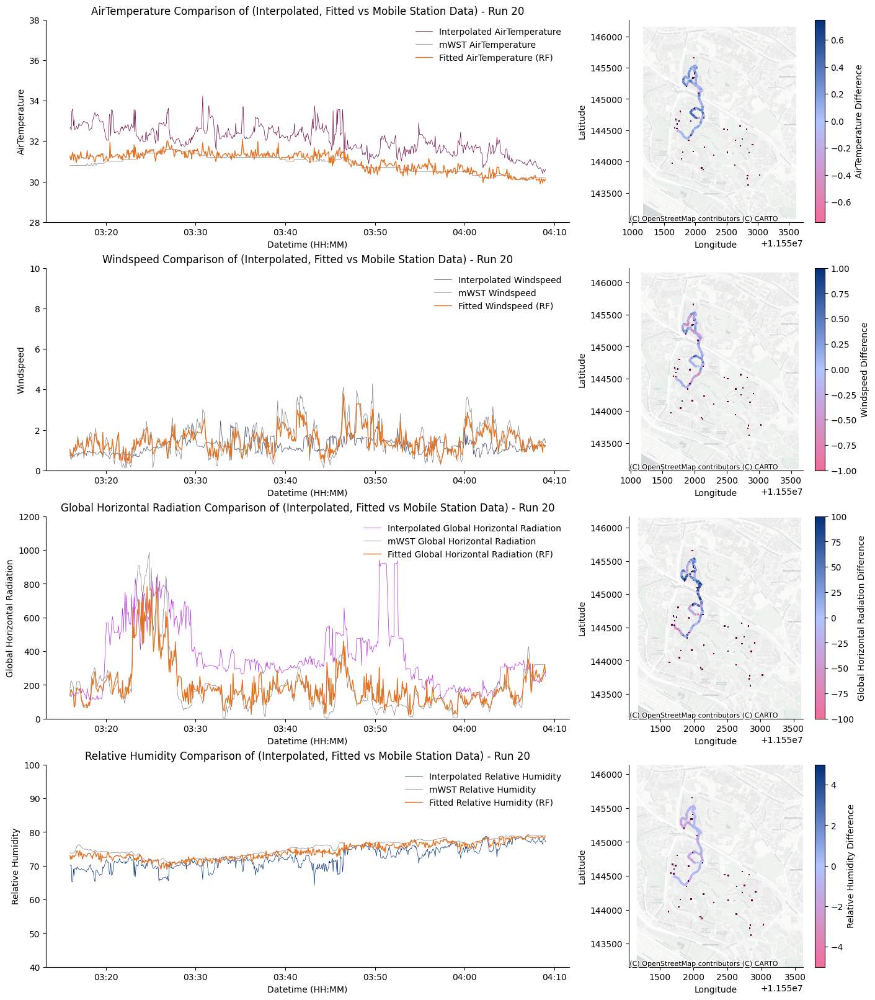


Metrics for AirTemperature:


,Run,MAE,MSE,RMSE,MAPE
0,9,0.182771,0.052210,0.228495,0.580956
1,10,0.135609,0.032304,0.179734,0.413439
2,11,0.126857,0.027964,0.167226,0.420567
3,12,0.065395,0.006633,0.081443,0.225184
4,15,0.127737,0.031397,0.177191,0.406874
5,16,0.178701,0.050010,0.223629,0.557934
6,17,0.113437,0.024544,0.156665,0.356319
7,18,0.178214,0.051598,0.227152,0.558289
8,19,0.146196,0.043905,0.209535,0.444307
9,20,0.182702,0.056802,0.238331,0.586539



Metrics for Windspeed:


,Run,MAE,MSE,RMSE,MAPE
0,9,0.162238,0.045030,0.212204,13.541300
1,10,0.169475,0.056790,0.238307,11.707368
2,11,0.287692,0.184513,0.429549,18.124217
3,12,0.227318,0.093294,0.305440,20.152740
4,15,0.197948,0.068279,0.261303,18.318019
5,16,0.239912,0.100201,0.316545,19.508174
6,17,0.244422,0.105194,0.324337,20.780975
7,18,0.211568,0.082635,0.287463,19.872349
8,19,0.269339,0.125728,0.354582,20.086475
9,20,0.275537,0.127333,0.356837,19.590066



Metrics for Global Horizontal Radiation:


,Run,MAE,MSE,RMSE,MAPE
0,9,23.305605,1408.729137,37.533041,16.003987
1,10,69.091382,8262.888577,90.900432,27.113839
2,11,57.001955,5731.149346,75.704355,27.022717
3,12,6.410218,94.712327,9.732026,21.342040
4,15,5.628351,89.932238,9.483261,25.136484
5,16,18.332705,714.405120,26.728358,23.451280
6,17,19.487637,954.098843,30.888490,21.979784
7,18,78.353398,10369.252884,101.829529,24.745542
8,19,43.886863,5130.241714,71.625706,22.796018
9,20,54.395594,6618.740904,81.355645,27.555314



Metrics for Relative Humidity:


,Run,MAE,MSE,RMSE,MAPE
0,9,0.537169,0.508059,0.712782,0.793449
1,10,0.489834,0.411162,0.641219,0.816046
2,11,0.606825,0.614822,0.784106,0.853690
3,12,0.341611,0.216482,0.465277,0.444893
4,15,0.474760,0.400547,0.632887,0.670181
5,16,0.493310,0.429118,0.655071,0.694491
6,17,0.472052,0.409625,0.640019,0.662986
7,18,0.684129,0.813808,0.902113,0.999619
8,19,0.633718,0.756161,0.869575,0.989007
9,20,0.906126,1.335532,1.155652,1.226187


In [8]:
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.dates as mdates

# Load weather station data into a DataFrame
weather_stations_df = pd.read_csv(r"C:\Users\gottk\OneDrive\GITHUB\calma-esse-heat-stress-internal\Esse\data\krigging\WS_features_updated.csv")

# Create a GeoDataFrame for weather stations
geometry = [
    Point(lon, lat) if t == 'Point' else Polygon([(lon-0.0001, lat-0.0001), (lon+0.0001, lat-0.0001), (lon+0.0001, lat+0.0001), (lon-0.0001, lat+0.0001)])
    for lon, lat, t in zip(weather_stations_df['Lon'], weather_stations_df['Lat'], weather_stations_df['Type'])
]
weather_gdf = gpd.GeoDataFrame(weather_stations_df, geometry=geometry, crs="EPSG:4326")
# Reproject to Web Mercator projection
weather_gdf = weather_gdf.to_crs(epsg=3857)

# List of specific run numbers to show
desired_runs = [9, 10, 11, 12, 15, 16, 17, 18, 19, 20]
time_windows = {
    9: ['2024-03-14 16:00:00+08:00', '2024-03-14 17:07:47+08:00'],
    10: ['2024-03-19 13:45:57+08:00', '2024-03-19 14:50:51+08:00'],
    12: ['2024-03-21 16:37:32+08:00', '2024-03-21 17:29:35+08:00'],
    11: ['2024-03-20 09:50:42+08:00', '2024-03-20 10:55:40+08:00'],
    15: ['2024-04-02 18:00:40+08:00', '2024-04-02 19:04:07+08:00'],
    16: ['2024-04-05 17:10:30+08:00', '2024-04-05 18:22:20+08:00'],
    17: ['2024-04-06 15:40:34+08:00', '2024-04-06 16:50:50+08:00'],
    18: ['2024-04-07 10:16:30+08:00', '2024-04-07 11:15:11+08:00'],
    19: ['2024-04-07 13:25:04+08:00', '2024-04-07 14:48:51+08:00'],
    20: ['2024-04-08 11:15:58+08:00', '2024-04-08 12:09:00+08:00'],
}

# Combine all runs into a single DataFrame for fitting
combined_df = pd.DataFrame()

for run in desired_runs:
    run_df = Int_df[Int_df['run_number'] == run]
    start_time = pd.to_datetime(time_windows[run][0])
    end_time = pd.to_datetime(time_windows[run][1])
    run_df = run_df[(run_df['index_time'] >= start_time) & (run_df['index_time'] <= end_time)]
    combined_df = pd.concat([combined_df, run_df], ignore_index=True)

# Drop rows with NaN values in c_longitude
combined_df = combined_df.dropna(subset=['c_longitude'])

# Custom colormap from #afc3ff to #4e79a7
colors = ['#f26d9c', '#afc3ff', '#013078']
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

# Apply RandomForest Regressor for each measure
measures = {
    'AirTemperature': ['AirTemperature', 'mWST_Temperature_C', 'Fitted_Temperature', 'Temperature_Difference', (28, 38), (-0.75, 0.75), '#680040'],
    'Windspeed': ['WindSpeed', 'mWST_Windspeed_ms', 'Fitted_Windspeed', 'Windspeed_Difference', (0, 10), (-1, 1), '#424767'],
    'Global Horizontal Radiation': ['Radiation', 'mWST_Solar_radiation_Wm', 'Fitted_Radiation', 'Radiation_Difference', (0, 1200), (-100, 100), '#b52ce3'],
    'Relative Humidity': ['Humidity', 'mWST_Relativehumidity_p', 'Fitted_Humidity', 'Humidity_Difference', (40, 100), (-5, 5), '#013078']
}

# Dictionary to store metrics for each measure
metrics_dict = {measure: pd.DataFrame() for measure in measures.keys()}

# Store fitted models for future use
fitted_models = {}

# Fit the model for each measure using the combined data
for measure, (interp_col, wst_col, fitted_col, diff_col, _, _, _) in measures.items():
    X = combined_df[[interp_col]].values  # Interpolated values as features
    y = combined_df[wst_col].values  # Real mobile weather station data as target

    # Fit Random Forest Regressor
    rf_regressor = RandomForestRegressor(n_estimators=100, random_state=404)
    rf_regressor.fit(X, y)

    # Store the fitted model for future use
    fitted_models[measure] = rf_regressor

    # Make predictions for the combined data
    combined_df[fitted_col] = rf_regressor.predict(X)
    combined_df[diff_col] = combined_df[fitted_col] - combined_df[wst_col]

# Loop through each run and plot all four measures in one layout
for run in desired_runs:
    # Set up the 4x2 layout with gridspec_kw to control the width ratios (75% and 25%)
    fig, axs = plt.subplots(4, 2, figsize=(14, 16), gridspec_kw={'width_ratios': [3, 1]}, constrained_layout=True)

    for i, (measure, (interp_col, wst_col, fitted_col, diff_col, ylim_range, diff_range, interp_color)) in enumerate(measures.items()):
        # Filter data for the current run
        run_df = combined_df[combined_df['run_number'] == run]

        # Line plot (75% of space) on the left side
        ax_line = axs[i, 0]
        ax_line.plot(run_df['index_time'], run_df[interp_col], label=f'Interpolated {measure}', color=interp_color, linewidth=0.5)  # Interpolated line with specific color
        ax_line.plot(run_df['index_time'], run_df[wst_col], label=f'mWST {measure}', color='gray', linewidth=0.5)  # Nearest Wst in gray
        ax_line.plot(run_df['index_time'], run_df[fitted_col], label=f'Fitted {measure} (RF)', linestyle='-', color='#e37222', linewidth=1.0)  # Fitted in green

        ax_line.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))                

        ax_line.set_xlabel('Datetime (HH:MM)')
        ax_line.set_ylabel(f'{measure}')
        ax_line.legend()
        ax_line.set_ylim(ylim_range)
        ax_line.spines['top'].set_visible(False)
        ax_line.spines['right'].set_visible(False)
        ax_line.set_title(f'{measure} Comparison of (Interpolated, Fitted vs Mobile Station Data) - Run {run}')
        ax_line.legend(frameon=False) 
        
        # Convert DataFrame to GeoDataFrame for map plotting
        gdf = gpd.GeoDataFrame(run_df, geometry=gpd.points_from_xy(run_df['c_longitude'], run_df['c_latitude']), crs="EPSG:4326")
        gdf = gdf.to_crs(epsg=3857)

        # Map plot (25% of space) on the right side
        ax_map = axs[i, 1]
        sc = ax_map.scatter(gdf.geometry.x, gdf.geometry.y, c=run_df[diff_col], cmap=custom_cmap, norm=mcolors.Normalize(vmin=diff_range[0], vmax=diff_range[1]), marker='o', s=2)

        # Add weather station markers
        weather_gdf[weather_gdf['Type'] == 'Weather station'].plot(ax=ax_map, marker='^', color='#680040', markersize=10, label='Weather Station (Point)')
        weather_gdf[weather_gdf['Type'] == 'Meteorological tower'].plot(ax=ax_map, color='#66aec5', alpha=0.5, markersize=10, label='Meteorological Tower')

        # Set map limits
        ax_map.set_xlim(weather_gdf.total_bounds[0], weather_gdf.total_bounds[2])  # Longitude range
        ax_map.set_ylim(143500, 145800)  # Latitude range
        ax_map.set_aspect('equal', adjustable='datalim')

        # Add basemap
        ctx.add_basemap(ax_map, source=ctx.providers.CartoDB.Positron, crs=weather_gdf.crs)

        # Set titles and labels for map
        ax_map.set_xlabel('Longitude')
        ax_map.set_ylabel('Latitude')
        ax_map.spines['top'].set_visible(False)
        ax_map.spines['right'].set_visible(False)

        # Add color bar for temperature difference
        cbar = plt.colorbar(sc, ax=ax_map)
        cbar.set_label(f'{measure} Difference')

    # Show the 4x4 layout for the current run
    plt.savefig(f'C:/Users/gottk/OneDrive/GITHUB/calma-esse-heat-stress-internal/Esse/report/_03-Validation/ModelFitting_run_{run}.png')

    plt.show()

    # Calculate metrics for each measure for the current run
    for measure, (interp_col, wst_col, fitted_col, diff_col, _, _, _) in measures.items():
        mae = run_df[diff_col].abs().mean()
        mse = (run_df[diff_col] ** 2).mean()
        rmse = mse ** 0.5
        mape = (run_df[diff_col].abs() / run_df[fitted_col]).mean() * 100

        # Store the metrics
        temp_df = pd.DataFrame({
            'Run': [run],
            'MAE': [mae],
            'MSE': [mse],
            'RMSE': [rmse],
            'MAPE': [mape]
        })

        # Append to metrics dict for the measure
        metrics_dict[measure] = pd.concat([metrics_dict[measure], temp_df], ignore_index=True)

# Display the metrics DataFrames for each measure
for measure, metrics_df in metrics_dict.items():
    print(f'\nMetrics for {measure}:')
    display(metrics_df)


In [ ]:
#Fit the DateFormatter
fitted_models['Radiation'].predict(new_data)

### Temperature

In [ ]:
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.colors as mcolors
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import numpy as np

# Load weather station data into a DataFrame
weather_stations_df = pd.read_csv(r"C:\Users\gottk\OneDrive\GITHUB\calma-esse-heat-stress-internal\Esse\data\krigging\WS_features_updated.csv")

# Create a GeoDataFrame for weather stations
geometry = [
    Point(lon, lat) if t == 'Point' else Polygon([(lon-0.0001, lat-0.0001), (lon+0.0001, lat-0.0001), (lon+0.0001, lat+0.0001), (lon-0.0001, lat+0.0001)])
    for lon, lat, t in zip(weather_stations_df['Lon'], weather_stations_df['Lat'], weather_stations_df['Type'])
]
weather_gdf = gpd.GeoDataFrame(weather_stations_df, geometry=geometry, crs="EPSG:4326")
# Reproject to Web Mercator projection
weather_gdf = weather_gdf.to_crs(epsg=3857)

# List of specific run numbers to show
desired_runs = [9, 10, 11, 12, 15, 16, 17, 18, 19, 20]
time_windows = {
    9: ['2024-03-14 16:00:00+08:00', '2024-03-14 17:07:47+08:00'],
    10: ['2024-03-19 13:45:57+08:00', '2024-03-19 14:50:51+08:00'],
    12: ['2024-03-21 16:37:32+08:00', '2024-03-21 17:29:35+08:00'],
    11: ['2024-03-20 09:50:42+08:00', '2024-03-20 10:55:40+08:00'],
    15: ['2024-04-02 18:00:40+08:00', '2024-04-02 19:04:07+08:00'],
    16: ['2024-04-05 17:10:30+08:00', '2024-04-05 18:22:20+08:00'],
    17: ['2024-04-06 15:40:34+08:00', '2024-04-06 16:50:50+08:00'],
    18: ['2024-04-07 10:16:30+08:00', '2024-04-07 11:15:11+08:00'],
    19: ['2024-04-07 13:25:04+08:00', '2024-04-07 14:48:51+08:00'],
    20: ['2024-04-08 11:15:58+08:00', '2024-04-08 12:09:00+08:00'],
}

# Combine all runs into a single DataFrame for fitting
combined_df = pd.DataFrame()

for run in desired_runs:
    run_df = Int_df[Int_df['run_number'] == run]
    start_time = pd.to_datetime(time_windows[run][0])
    end_time = pd.to_datetime(time_windows[run][1])
    run_df = run_df[(run_df['index_time'] >= start_time) & (run_df['index_time'] <= end_time)]
    combined_df = pd.concat([combined_df, run_df], ignore_index=True)


combined_df = combined_df.dropna(subset=['c_longitude'])
# Prepare features (AirTemperature) and target (Nearest_Wst_Temperature_C) for Random Forest fitting
X = combined_df[['AirTemperature']].values  # Interpolated values as features
y = combined_df['Nearest_Wst_Temperature_C'].values  # Real mobile weather station data as target

# Fit Random Forest Regressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
rf_regressor.fit(X, y)

# Make predictions and calculate the difference
combined_df['Fitted_Temperature'] = rf_regressor.predict(X)
combined_df['Temperature_Difference'] = combined_df['Fitted_Temperature'] - combined_df['Nearest_Wst_Temperature_C']


metrics_df = pd.DataFrame()

# Now plot for each run
for run in desired_runs:
    # Filter data for the current run
    run_df = combined_df[combined_df['run_number'] == run]

    # Create a figure with two subplots side by side (1 row, 2 columns)
    fig, ax = plt.subplots(1, 2, figsize=(18, 8), constrained_layout=True)

    # Plot the temperature data on the first subplot
    ax[0].plot(run_df['index_time'], run_df['AirTemperature'], label='Interpolated AirTemperature')
    ax[0].plot(run_df['index_time'], run_df['Nearest_Wst_Temperature_C'], label='Nearest_Wst_Temperature_C')
    ax[0].plot(run_df['index_time'], run_df['Fitted_Temperature'], label='Fitted Temperature (RF)', linestyle='--')
    ax[0].set_title(f'Temperature Comparison (Run {run})')
    ax[0].set_xlabel('Datetime')
    ax[0].set_ylabel('Temperature (°C)')
    ax[0].legend()
    ax[0].set_ylim(28, 38)  # y-axis range

    # Convert DataFrame to GeoDataFrame
    gdf = gpd.GeoDataFrame(run_df, geometry=gpd.points_from_xy(run_df['c_longitude'], run_df['c_latitude']), crs="EPSG:4326")
    gdf = gdf.to_crs(epsg=3857)

    # Use a colormap for the difference
    cmap = plt.cm.coolwarm
    norm = mcolors.Normalize(vmin=-0.75, vmax=0.75)

    # Plot the path of the run on the second subplot (map with basemap)
    sc = ax[1].scatter(gdf.geometry.x, gdf.geometry.y, c=run_df['Temperature_Difference'], cmap=cmap, norm=norm, marker='o', s=15, label='Run Path')

    # Add the weather station markers
    weather_gdf[weather_gdf['Type'] == 'Weather station'].plot(ax=ax[1], marker='^', color='red', markersize=25, label='Weather Station (Point)')
    weather_gdf[weather_gdf['Type'] == 'Meteorological tower'].plot(ax=ax[1], color='green', alpha=0.5, markersize=45, label='Meteorological Tower')

    # Set the x-axis and y-axis limits
    ax[1].set_xlim(weather_gdf.total_bounds[0], weather_gdf.total_bounds[2])  # Longitude range
    ax[1].set_ylim(143500, 145800)  # y-axis range
    ax[1].set_aspect('equal', adjustable='datalim')

    # Add basemap from contextily
    ctx.add_basemap(ax[1], source=ctx.providers.CartoDB.Positron, crs=weather_gdf.crs)

    # Set titles and labels for the map
    ax[1].set_title(f'Temperature Difference (Fitted vs Mobile) - Run {run}')
    ax[1].set_xlabel('Longitude')
    ax[1].set_ylabel('Latitude')

    # Add a color bar to show the magnitude of the temperature differences
    cbar = plt.colorbar(sc, ax=ax[1])
    cbar.set_label('Temperature Difference (°C)')

    # Show the plots
    plt.show()

    # Calculate metrics for the current run
    mae = run_df['Temperature_Difference'].abs().mean()
    mse = (run_df['Temperature_Difference'] ** 2).mean()
    rmse = mse ** 0.5
    mape = (run_df['Temperature_Difference'].abs() / run_df['Fitted_Temperature']).mean() * 100

    # Create a temporary DataFrame for the current run's metrics
    temp_df = pd.DataFrame({
        'Run': [run],
        'MAE': [mae],
        'MSE': [mse],
        'RMSE': [rmse],
        'MAPE': [mape]
    })

    # Concatenate the temp_df to metrics_df
    metrics_df = pd.concat([metrics_df, temp_df], ignore_index=True)

# Display the metrics DataFrame
display(metrics_df)


#### Testing Temperature

In [ ]:
from sklearn.linear_model import RANSACRegressor, LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# List of specific run numbers to show
desired_runs = [9, 10, 11, 12, 15, 16, 17, 18, 19, 20]

# Time windows for each run
time_windows = {
    9: ['2024-03-14 16:00:00+08:00', '2024-03-14 17:07:47+08:00'],
    10: ['2024-03-19 13:45:57+08:00', '2024-03-19 14:50:51+08:00'],
    12: ['2024-03-21 16:37:32+08:00', '2024-03-21 17:29:35+08:00'],
    11: ['2024-03-20 09:50:42+08:00', '2024-03-20 10:55:40+08:00'],
    15: ['2024-04-02 18:00:40+08:00', '2024-04-02 19:04:07+08:00'],
    16: ['2024-04-05 17:10:30+08:00', '2024-04-05 18:22:20+08:00'],
    17: ['2024-04-06 15:40:34+08:00', '2024-04-06 16:50:50+08:00'],
    18: ['2024-04-07 10:16:30+08:00', '2024-04-07 11:15:11+08:00'],
    19: ['2024-04-07 13:25:04+08:00', '2024-04-07 14:48:51+08:00'],
    20: ['2024-04-08 11:15:58+08:00', '2024-04-08 12:09:00+08:00'],
}

# Combine data from all runs within the defined time windows
combined_df = pd.DataFrame()  # Initialize an empty DataFrame to store combined data

for run in desired_runs:
    # Filter data for the specific run
    run_specific_df = Int_df[Int_df['run_number'] == run]

    # Apply the time window filter for this run
    start_time = pd.to_datetime(time_windows[run][0])
    end_time = pd.to_datetime(time_windows[run][1])
    run_specific_df = run_specific_df[(run_specific_df['index_time'] >= start_time) & (run_specific_df['index_time'] <= end_time)]

    # Combine the filtered data into a single DataFrame
    combined_df = pd.concat([combined_df, run_specific_df], ignore_index=True)

# Prepare features (interpolated AirTemperature) and target (real Nearest_Wst_Temperature_C) for the combined data
X_combined = combined_df[['AirTemperature']].values  # Interpolated values as the feature
y_combined = combined_df['Nearest_Wst_Temperature_C'].values  # Real weather station data as the target

# Initialize the RANSAC regressor
ransac = RANSACRegressor()
ransac.fit(X_combined, y_combined)  # Fit the model on the combined data
combined_df['RANSAC_Temperature_Predicted'] = ransac.predict(X_combined)  # Predict using the RANSAC model

# Initialize the OLS regressor (Linear Regression)
ols = LinearRegression()
ols.fit(X_combined, y_combined)  # Fit the model on the combined data
combined_df['OLS_Temperature_Predicted'] = ols.predict(X_combined)  # Predict using the OLS model

# Initialize the Polynomial Regression (degree 2 for simplicity)
poly = PolynomialFeatures(degree=2)  # Adjust degree as needed
X_poly_combined = poly.fit_transform(X_combined)  # Transform the features to include polynomial terms
poly_reg = LinearRegression()
poly_reg.fit(X_poly_combined, y_combined)  # Fit the model on the transformed features
combined_df['Poly_Temperature_Predicted'] = poly_reg.predict(X_poly_combined)  # Predict using the Polynomial Regression model

# Initialize the Random Forest Regressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
rf_regressor.fit(X_combined, y_combined)  # Fit the model on the combined data
combined_df['RF_Temperature_Predicted'] = rf_regressor.predict(X_combined)  # Predict using the Random Forest model

# Plot results for each run using the combined model predictions
for run in desired_runs:
    # Extract the specific run's data from the combined DataFrame
    run_specific_df = combined_df[combined_df['run_number'] == run]

    # Plot the temperature data for the specific run (original interpolated, actual, and all model predictions)
    plt.figure(figsize=(10, 6))

    # Plot original interpolated AirTemperature
    plt.plot(run_specific_df['index_time'], run_specific_df['AirTemperature'], label='Interpolated AirTemperature', color='orange')

    # Plot actual Nearest_Wst_Temperature_C
    plt.plot(run_specific_df['index_time'], run_specific_df['Nearest_Wst_Temperature_C'], label='Actual Nearest_Wst_Temperature_C', color='blue')

    # Plot RANSAC-predicted values
    #plt.plot(run_specific_df['index_time'], run_specific_df['RANSAC_Temperature_Predicted'], label='RANSAC Predicted Temperature', color='green', linestyle='--')

    # Plot OLS-predicted values
    #plt.plot(run_specific_df['index_time'], run_specific_df['OLS_Temperature_Predicted'], label='OLS Predicted Temperature', color='red', linestyle=':')

    # Plot Polynomial Regression-predicted values
    plt.plot(run_specific_df['index_time'], run_specific_df['Poly_Temperature_Predicted'], label='Polynomial Predicted Temperature', color='purple', linestyle='-.')

    # Plot Random Forest-predicted values
    plt.plot(run_specific_df['index_time'], run_specific_df['RF_Temperature_Predicted'], label='Random Forest Predicted Temperature', color='brown', linestyle='-')

    # Add titles and labels
    plt.title(f'Run {run}: Interpolated, Actual, RANSAC, OLS, Polynomial, and RF-Predicted Temperatures')
    plt.xlabel('Datetime')
    plt.ylabel('Temperature (°C)')
    plt.legend()

    # Display the plot
    plt.show()

# Calculate error metrics (MAE, MSE, RMSE, MAPE) for each model
metrics = {
    'Model': ['RANSAC', 'OLS', 'Polynomial', 'Random Forest'],
    'MAE': [
        mean_absolute_error(y_combined, combined_df['RANSAC_Temperature_Predicted']),
        mean_absolute_error(y_combined, combined_df['OLS_Temperature_Predicted']),
        mean_absolute_error(y_combined, combined_df['Poly_Temperature_Predicted']),
        mean_absolute_error(y_combined, combined_df['RF_Temperature_Predicted'])
    ],
    'MSE': [
        mean_squared_error(y_combined, combined_df['RANSAC_Temperature_Predicted']),
        mean_squared_error(y_combined, combined_df['OLS_Temperature_Predicted']),
        mean_squared_error(y_combined, combined_df['Poly_Temperature_Predicted']),
        mean_squared_error(y_combined, combined_df['RF_Temperature_Predicted'])
    ],
    'RMSE': [
        np.sqrt(mean_squared_error(y_combined, combined_df['RANSAC_Temperature_Predicted'])),
        np.sqrt(mean_squared_error(y_combined, combined_df['OLS_Temperature_Predicted'])),
        np.sqrt(mean_squared_error(y_combined, combined_df['Poly_Temperature_Predicted'])),
        np.sqrt(mean_squared_error(y_combined, combined_df['RF_Temperature_Predicted']))
    ],
    'MAPE': [
        np.mean(np.abs((y_combined - combined_df['RANSAC_Temperature_Predicted']) / y_combined)) * 100,
        np.mean(np.abs((y_combined - combined_df['OLS_Temperature_Predicted']) / y_combined)) * 100,
        np.mean(np.abs((y_combined - combined_df['Poly_Temperature_Predicted']) / y_combined)) * 100,
        np.mean(np.abs((y_combined - combined_df['RF_Temperature_Predicted']) / y_combined)) * 100
    ]
}

# Create a DataFrame to display the error metrics
metrics_df = pd.DataFrame(metrics)

# Display the metrics DataFrame
display(metrics_df)


## Time investigation

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_measure_differences_by_run(Int_df):
    unique_runs = Int_df['run_number'].unique()
    
    for run_number in unique_runs:
        df_run = Int_df[Int_df['run_number'] == run_number].copy()
        df_run = Int_df[(Int_df['run_number'] == run_number) & (Int_df['time_difference'] < 150)].copy()



        # Calculate differences for each measure
        df_run['Temperature_Difference'] = df_run['Nearest_Wst_Temperature_C'] - df_run['AirTemperature']
        df_run['Humidity_Difference'] = df_run['Nearest_Wst_Relativehumidity_p'] - df_run['Humidity']
        df_run['Radiation_Difference'] = df_run['Nearest_Wst_Solar_radiation_Wm'] - df_run['Radiation']
        df_run['WindSpeed_Difference'] = df_run['Nearest_Wst_Windspeed_ms'] - df_run['WindSpeed']
        
        # Print min and max times for debugging
        min_time = df_run['index_time'].min()
        max_time = df_run['index_time'].max()
        print(f"{min_time}, {max_time}")
        
        # Create a new figure for each run_number
        fig, ax1 = plt.subplots(figsize=(12, 8))
        
        # Plot Temperature, Humidity, and WindSpeed on the primary y-axis
        sns.lineplot(x=df_run['index_time'], y=df_run['Temperature_Difference'], label='Temperature Difference', color='green', marker='o', ax=ax1)
        sns.lineplot(x=df_run['index_time'], y=df_run['Humidity_Difference'], label='Humidity Difference', color='blue', marker='o', ax=ax1)
        sns.lineplot(x=df_run['index_time'], y=df_run['WindSpeed_Difference'], label='WindSpeed Difference', color='purple', marker='o', ax=ax1)
        
        # Create a secondary y-axis for Radiation
        ax2 = ax1.twinx()
        sns.lineplot(x=df_run['index_time'], y=df_run['Radiation_Difference'], label='Radiation Difference', color='red', marker='o', ax=ax2)
        
        # Customize the plot
        ax1.set_xlabel('Index Time')
        ax1.set_ylabel('Temperature, Humidity, WindSpeed Difference', color='black')
        ax2.set_ylabel('Radiation Difference', color='red')
        
        ax1.set_title(f'Measure Differences for Run {run_number}')
        
        # Set x-axis limits to the range of index_time for this run_number
        ax1.set_xlim(min_time, max_time)
        
        # Add grid, legends, and adjust layout
        ax1.grid(True)
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')
        plt.xticks(rotation=45)
        plt.tight_layout()
        
        # Show plot
        plt.show()

# Usage
plot_measure_differences_by_run(Int_df)


In [ ]:
import plotly.express as px

def plot_measures_spatially_plotly(Int_df):
    # Calculate differences for each measure if not already done
    Int_df['Temperature_Difference'] = Int_df['Nearest_Wst_Temperature_C'] - Int_df['AirTemperature']
    Int_df['Humidity_Difference'] = Int_df['Nearest_Wst_Relativehumidity_p'] - Int_df['Humidity']
    Int_df['Radiation_Difference'] = Int_df['Nearest_Wst_Solar_radiation_Wm'] - Int_df['Radiation']
    Int_df['WindSpeed_Difference'] = Int_df['Nearest_Wst_Windspeed_ms'] - Int_df['WindSpeed']
    
    # Create a list of measures to plot
    measures = {
        'Temperature_Difference': 'Temperature',
        'Humidity_Difference': 'Humidity',
        'Radiation_Difference': 'Radiation',
        'WindSpeed_Difference': 'WindSpeed'
    }
    
    for diff_col, measure_name in measures.items():
        # Remove rows with NaN values in the difference column
        df_plot = Int_df.dropna(subset=[diff_col]).copy()
        
        # Ensure non-negative size values
        df_plot[diff_col] = df_plot[diff_col].clip(lower=0)  # Replace negative sizes with 0
        
        # Create the scatter plot for each measure
        fig = px.scatter(df_plot, 
                         x='c_longitude', 
                         y='c_latitude', 
                         color=diff_col, 
                         color_continuous_scale='Viridis', 
                         size=diff_col, 
                         title=f'Spatial Distribution of {measure_name} Differences',
                         labels={'c_longitude': 'Longitude', 'c_latitude': 'Latitude', diff_col: f'{measure_name} Difference'})
        
        # Update layout for specific dimensions
        fig.update_layout(
            xaxis_title='Longitude',
            yaxis_title='Latitude',
            coloraxis_colorbar=dict(title=f'{measure_name} Difference'),
            margin=dict(l=0, r=0, t=40, b=0),
            width=800,
            height=600
        )
        
        # Show plot
        fig.show()

# Usage
plot_measures_spatially_plotly(Int_df)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_measure_boxplots(Int_df):
    # Calculate differences for each measure
    Int_df = Int_df[Int_df['time_difference'] < 150].copy()

    Int_df['Temperature_Difference'] = Int_df['Nearest_Wst_Temperature_C'] - Int_df['AirTemperature']
    Int_df['Humidity_Difference'] = Int_df['Nearest_Wst_Relativehumidity_p'] - Int_df['Humidity']
    Int_df['Radiation_Difference'] = Int_df['Nearest_Wst_Solar_radiation_Wm'] - Int_df['Radiation']
    Int_df['WindSpeed_Difference'] = Int_df['Nearest_Wst_Windspeed_ms'] - Int_df['WindSpeed']
    
    # Melt the dataframe to long format for easier plotting with Seaborn
    df_melted = Int_df.melt(id_vars=['run_number'], 
                            value_vars=['Temperature_Difference', 'Humidity_Difference', 'WindSpeed_Difference'], 
                            var_name='Measure', 
                            value_name='Difference')
    
    # Create a figure with two y-axes
    fig, ax1 = plt.subplots(figsize=(12, 8))
    
    # Plot boxplots for Temperature, Humidity, and WindSpeed on the primary y-axis
    sns.boxplot(x='Measure', y='Difference', data=df_melted, palette='Set2', ax=ax1)
    ax1.set_title('Boxplots of Difference Values for Each Measure')
    ax1.set_xlabel('Measure')
    ax1.set_ylabel('Difference')
    ax1.grid(True, linestyle='--', alpha=0.7)
    
    # Create a secondary y-axis for Radiation
    ax2 = ax1.twinx()
    
    # Melt the dataframe to long format for Radiation only
    df_radiation = Int_df[['run_number', 'Radiation_Difference']].copy()
    df_radiation_melted = df_radiation.melt(id_vars=['run_number'], 
                                            value_vars=['Radiation_Difference'], 
                                            var_name='Measure', 
                                            value_name='Difference')
    
    # Plot boxplots for Radiation on the secondary y-axis
    sns.boxplot(x='Measure', y='Difference', data=df_radiation_melted, palette='Reds', ax=ax2)
    ax2.set_ylabel('Radiation Difference', color='red')
    
    # Customize the plot
    ax1.set_xlabel('Measure')
    ax1.set_ylabel('Difference')
    ax2.set_ylabel('Radiation Difference', color='red')
    
    # Show plot
    plt.tight_layout()
    plt.show()

# Usage
plot_measure_boxplots(Int_df)


## With Participants Data

In [ ]:
# Import Cozie dataframe with weatherdata

participant_data_local_df = pd.read_csv(r'C:\Users\gottk\OneDrive\GITHUB\calma-esse-heat-stress-internal\Esse\src\cozieMeasureDf.csv', parse_dates=['index_time'])

# Convert datetime column to 'Asia/Singapore' timezone using tz_convert
participant_data_local_df['index_time'] = pd.to_datetime(participant_data_local_df['index_time'], format='mixed')
participant_data_local_df['index_time'] = participant_data_local_df['index_time'].dt.tz_convert('Asia/Singapore')

display(participant_data_local_df.head(5))

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

participant = 'esse00'

# Define the color mapping for the q_thermal_sensation values
color_map = {
    'hot': 'red',
    'neutral': 'gray',
    'slightly warm': 'orange',
    'slightly cool': 'cyan',
    'cool': 'blue'
}

# Filter the dataframe
filtered_df = participant_data_local_df[
    (participant_data_local_df['id_participant'] == participant) & 
    (participant_data_local_df['AirTemperature_time_difference'] < 300)
]

# Extract the day from the 'index_time' column
filtered_df['day'] = filtered_df['index_time'].dt.floor('D')

# Get the unique days
unique_days = filtered_df['day'].unique()

# Initialize counters for total data points
total_air_temperature = 0
total_humidity = 0
total_radiation = 0
total_windspeed = 0

# Initialize counters for Outdoor and non-Outdoor data points
total_outdoor_points = 0
total_non_outdoor_points = 0

# Loop through each unique day and create a plot
for day in unique_days:
    daily_data = filtered_df[filtered_df['day'] == day]
    
    # Filter for "Outdoor" and "Non-Outdoor" locations
    outdoor_data = daily_data[daily_data['q_general_location_envi'] == 'Outdoor']
    non_outdoor_data = daily_data[(daily_data['q_general_location_envi'] == 'Indoor') | 
                                    (daily_data['q_general_location_envi'] == 'Semi-Outdoor')]

    # Count data points
    total_outdoor_points += len(outdoor_data)
    total_non_outdoor_points += len(non_outdoor_data)

    fig, ax1 = plt.subplots(figsize=(14, 5))

    # Plot Air Temperature on the primary y-axis
    line1, = ax1.plot(daily_data['index_time'], daily_data['AirTemperature'], label='Air Temperature', color='blue')
    ax1.set_xlabel('Index Time')
    ax1.set_ylabel('Air Temperature (°C)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_ylim(22, 42)  # Adjust y-axis limits for Air Temperature

    # Create a second y-axis for Humidity
    ax2 = ax1.twinx()
    line2, = ax2.plot(daily_data['index_time'], daily_data['Humidity'], label='Humidity', color='green')
    ax2.set_ylabel('Humidity (%)', color='green')
    ax2.tick_params(axis='y', labelcolor='green')
    ax2.set_ylim(0, 100)

    # Create a third y-axis for Radiation
    ax3 = ax1.twinx()
    ax3.spines['right'].set_position(('outward', 60))  # Offset the third axis to the right
    line3, = ax3.plot(daily_data['index_time'], daily_data['Radiation'], label='Radiation', color='red')
    ax3.set_ylabel('Radiation (W/m²)', color='red')
    ax3.tick_params(axis='y', labelcolor='red')
    ax3.set_ylim(0, 1200)

    # Create a fourth y-axis for Wind Speed
    ax4 = ax1.twinx()
    ax4.spines['right'].set_position(('outward', 120))  # Offset the fourth axis further to the right
    line4, = ax4.plot(daily_data['index_time'], daily_data['WindSpeed'], label='Wind Speed', color='purple')
    ax4.set_ylabel('Wind Speed (m/s)', color='purple')
    ax4.tick_params(axis='y', labelcolor='purple')
    ax4.set_ylim(0, daily_data['WindSpeed'].max() + 5)  # Adjust y-axis limits

    # Plot the q_thermal_sensation points for "Outdoor" data at fixed temperature value of 40
    fixed_temperature = 40
    scatter_handles = []
    for sensation, color in color_map.items():
        sensation_data = outdoor_data[outdoor_data['q_comfort_sensation'] == sensation]
        scatter_handle = ax1.scatter(sensation_data['index_time'], [fixed_temperature] * len(sensation_data), 
                                     color=color, label=sensation, marker='o', alpha=1)  # Plot at fixed temperature with black outline
        scatter_handles.append(scatter_handle)

    # Plot the q_thermal_sensation points for non-"Outdoor" data with black outline
    for sensation, color in color_map.items():
        sensation_data = non_outdoor_data[non_outdoor_data['q_comfort_sensation'] == sensation]
        ax1.scatter(sensation_data['index_time'], [fixed_temperature] * len(sensation_data), 
                    edgecolor='black', linewidth=2, color=color, label=f'{sensation} (Non-Outdoor)', marker='o', alpha=0.6)

    # Add a title and grid
    plt.title(f'Environmental Data over Time for Participant {participant} on {day.date()}')
    ax1.grid(True)

    # Add legend combining all handles
    handles, labels = [], []
    for handle, label in zip([line1, line2, line3, line4] + scatter_handles, 
                             ['Air Temperature', 'Humidity', 'Radiation', 'Wind Speed'] + list(color_map.keys())):
        handles.append(handle)
        labels.append(label)
    
    ax1.legend(handles=handles, labels=labels, loc='center left', frameon=False, bbox_to_anchor=(1.35, 0.9))

    # Show the plot
    fig.tight_layout()  # Adjust layout to prevent overlap
    plt.show()

    # Update total counts
    total_air_temperature += daily_data['AirTemperature'].notna().sum()
    total_humidity += daily_data['Humidity'].notna().sum()
    total_radiation += daily_data['Radiation'].notna().sum()
    total_windspeed += daily_data['WindSpeed'].notna().sum()

# Print total counts
print(f"Total data points for Air Temperature: {total_air_temperature}")
print(f"Total data points for Humidity: {total_humidity}")
print(f"Total data points for Radiation: {total_radiation}")
print(f"Total data points for Wind Speed: {total_windspeed}")
print(f"Total Outdoor data points: {total_outdoor_points}")
print(f"Total Non-Outdoor data points: {total_non_outdoor_points}")
print(f"Total combined data points: {total_outdoor_points + total_non_outdoor_points}")
